# Data Upload

In [1]:
# prompt: mount my drive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import zipfile
import os

# Replace with the actual path to your zip file in Google Drive
zip_file_path = "/content/drive/MyDrive/UCMerced_LandUse.zip"

# Destination directory for unzipped files
extract_dir = "/content/UCMerced_LandUse"


if not os.path.exists(extract_dir):
  os.makedirs(extract_dir)

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(f"Successfully extracted to: {extract_dir}")
file_paths = []
for root, dirs, files in os.walk(extract_dir):
    for file in files:
        file_paths.append(os.path.join(root,file))
file_paths


Successfully extracted to: /content/UCMerced_LandUse


['/content/UCMerced_LandUse/UCMerced_LandUse/readme.txt.bak',
 '/content/UCMerced_LandUse/UCMerced_LandUse/readme.txt',
 '/content/UCMerced_LandUse/UCMerced_LandUse/Images/buildings/buildings03.tif',
 '/content/UCMerced_LandUse/UCMerced_LandUse/Images/buildings/buildings13.tif',
 '/content/UCMerced_LandUse/UCMerced_LandUse/Images/buildings/buildings84.tif',
 '/content/UCMerced_LandUse/UCMerced_LandUse/Images/buildings/buildings89.tif',
 '/content/UCMerced_LandUse/UCMerced_LandUse/Images/buildings/buildings64.tif',
 '/content/UCMerced_LandUse/UCMerced_LandUse/Images/buildings/buildings34.tif',
 '/content/UCMerced_LandUse/UCMerced_LandUse/Images/buildings/buildings85.tif',
 '/content/UCMerced_LandUse/UCMerced_LandUse/Images/buildings/buildings05.tif',
 '/content/UCMerced_LandUse/UCMerced_LandUse/Images/buildings/buildings27.tif',
 '/content/UCMerced_LandUse/UCMerced_LandUse/Images/buildings/buildings04.tif',
 '/content/UCMerced_LandUse/UCMerced_LandUse/Images/buildings/buildings42.tif',


In [3]:
image_path="/content/UCMerced_LandUse/UCMerced_LandUse/Images" # Datapath where the images are stored

# Data Split

In [4]:
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import plot_model
import tensorflow as tf
import pandas as pd
import numpy as np
import os
import PIL
import pathlib
import shutil

In [5]:
import os
import random
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img

# Define paths
image_path = "/content/UCMerced_LandUse/UCMerced_LandUse/Images"
augmented_path = "/content/UCMerced_LandUse_Augmented"

# Create output directory
os.makedirs(augmented_path, exist_ok=True)

# Define augmentation transformations
datagen = ImageDataGenerator(
    rotation_range=20,         # Random rotation
    width_shift_range=0.2,     # Horizontal shift
    height_shift_range=0.2,    # Vertical shift
    shear_range=0.2,           # Shear transformation
    zoom_range=0.2,            # Zooming
    horizontal_flip=True,      # Flip horizontally
    brightness_range=[0.8,1.2] # Adjust brightness
)

# Target number of images per class
TARGET_SIZE = 1000  # Change to 1000 for 1000 images/class

# Process each category
for category in os.listdir(image_path):
    category_path = os.path.join(image_path, category)
    if not os.path.isdir(category_path):
        continue  # Skip non-directory files

    images = os.listdir(category_path)
    category_output = os.path.join(augmented_path, category)
    os.makedirs(category_output, exist_ok=True)

    # Copy original images
    for img in images:
        src = os.path.join(category_path, img)
        dest = os.path.join(category_output, img)
        shutil.copy(src, dest)

    # Augment until reaching TARGET_SIZE
    current_count = len(images)
    while current_count < TARGET_SIZE:
        img_name = random.choice(images)  # Pick a random image
        img_path = os.path.join(category_path, img_name)

        # Load image
        img = load_img(img_path)
        img_array = img_to_array(img)
        img_array = img_array.reshape((1,) + img_array.shape)

        # Generate one augmented image
        for batch in datagen.flow(img_array, batch_size=1):
            new_img = array_to_img(batch[0])
            new_img_name = f"aug_{current_count}.jpg"
            new_img_path = os.path.join(category_output, new_img_name)
            new_img.save(new_img_path)
            current_count += 1
            if current_count >= TARGET_SIZE:
                break  # Stop when target is reached

print(f"Dataset augmented to {TARGET_SIZE} images per class in '{augmented_path}'")


Dataset augmented to 1000 images per class in '/content/UCMerced_LandUse_Augmented'


In [6]:
import os
import shutil
import random

# Define paths
image_path = "/content/UCMerced_LandUse_Augmented"
output_dir = "/content/UCMerced_LandUse_Split"

train_ratio = 0.7
val_ratio = 0.2
test_ratio = 0.1

# Create output directories
for split in ["train", "val", "test"]:
    os.makedirs(os.path.join(output_dir, split), exist_ok=True)

# Process each category
for category in os.listdir(image_path):
    category_path = os.path.join(image_path, category)
    if not os.path.isdir(category_path):
        continue  # Skip non-directory files

    images = sorted(os.listdir(category_path))  # Sort images to maintain order
    random.shuffle(images)  # ✅ Shuffle before splitting

    # Compute split indices
    total_images = len(images)
    train_end = int(train_ratio * total_images)
    val_end = train_end + int(val_ratio * total_images)

    # Assign images to splits
    splits = {
        "train": images[:train_end],
        "val": images[train_end:val_end],
        "test": images[val_end:]
    }

    # Copy images to respective folders
    for split, split_images in splits.items():
        split_category_path = os.path.join(output_dir, split, category)
        os.makedirs(split_category_path, exist_ok=True)

        for img in split_images:
            src = os.path.join(category_path, img)
            dest = os.path.join(split_category_path, img)
            shutil.copy(src, dest)

print("Dataset successfully shuffled and split into train (70%), val (20%), and test (10%).")


Dataset successfully shuffled and split into train (70%), val (20%), and test (10%).


In [7]:
import tensorflow as tf
import numpy as np
from PIL import Image
import os

def load_tif_image(image_path, target_size=(256, 256)):
    img = Image.open(image_path).convert("RGB")  # Convert to RGB
    img = img.resize(target_size)
    img_array = np.array(img) / 255.0  # Normalize
    return img_array.astype(np.float32)  # Ensure correct dtype

def data_generator(directory):
    class_names = sorted(os.listdir(directory))  # Label names
    for label_idx, class_name in enumerate(class_names):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            for image_file in os.listdir(class_dir):
                if image_file.endswith(".tif"):  # Ensure only .tif files
                    image_path = os.path.join(class_dir, image_file)
                    img = load_tif_image(image_path)  # Load image
                    yield img, label_idx  # Yield image and label
def create_tf_dataset(directory, batch_size=32, shuffle_buffer_size=1000):
    dataset = tf.data.Dataset.from_generator(
        lambda: data_generator(directory),
        output_signature=(
            tf.TensorSpec(shape=(256, 256, 3), dtype=tf.float32),
            tf.TensorSpec(shape=(), dtype=tf.int32)
        )
    )
    dataset = dataset.shuffle(buffer_size=shuffle_buffer_size)  # 🔄 Shuffle dataset
    return dataset.batch(batch_size)


# Create datasets
train_dataset = create_tf_dataset("/content/UCMerced_LandUse_Split/train")
val_dataset = create_tf_dataset("/content/UCMerced_LandUse_Split/val")
test_dataset = create_tf_dataset("/content/UCMerced_LandUse_Split/test")

# Check shapes
for images, labels in train_dataset.take(1):
    print("Image batch shape:", images.shape)  # ✅ Should be (batch_size, 256, 256, 3)
    print("Label batch shape:", labels.shape)  # ✅ Should be (batch_size,)


Image batch shape: (32, 256, 256, 3)
Label batch shape: (32,)


In [8]:
# normalization_layer = tf.keras.layers.Rescaling(1./255)

# train_dataset = train_dataset.map(lambda x, y: (normalization_layer(x), y))
# val_dataset = val_dataset.map(lambda x, y: (normalization_layer(x), y))
# test_dataset = test_dataset.map(lambda x, y: (normalization_layer(x), y))


In [9]:
# IMG_SIZE = (256, 256)

# resize_layer = tf.keras.layers.Resizing(*IMG_SIZE)

# train_dataset = train_dataset.map(lambda x, y: (resize_layer(x), y))
# val_dataset = val_dataset.map(lambda x, y: (resize_layer(x), y))
# test_dataset = test_dataset.map(lambda x, y: (resize_layer(x), y))


In [10]:
# AUTOTUNE = tf.data.AUTOTUNE

# train_dataset = train_dataset.cache().prefetch(AUTOTUNE)
# val_dataset = val_dataset.batch(32).prefetch(AUTOTUNE)
# test_dataset = test_dataset.batch(32).prefetch(AUTOTUNE)


In [25]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Define the CNN Model
def build_model():
    inputs = keras.Input(shape=(256, 256, 3))

    # First Conv Block
    x = layers.Conv2D(32, (3, 3), padding="same", use_bias=True)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Second Conv Block
    x = layers.Conv2D(64, (3, 3), padding="same", use_bias=True)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Third Conv Block
    x = layers.Conv2D(128, (3, 3), padding="same", use_bias=True)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fourth Conv Block
    x = layers.Conv2D(256, (3, 3), padding="same", use_bias=True)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fifth Conv Block
    x = layers.Conv2D(512, (3, 3), padding="same", use_bias=True)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Global Average Pooling & Dropout
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)

    # Fully Connected Output Layer
    outputs = layers.Dense(21, activation="softmax")(x)

    # Compile Model
    model = keras.Model(inputs=inputs, outputs=outputs)
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=0.0001),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model

# Create Model
model = build_model()
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 256, 256, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 256, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_10 (Activation)           │ (None, 256, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 128, 128, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_11 (Activation)           │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_12 (Activation)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_13 (Activation)           │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │              

 Total params: 1,583,317 (6.04 MB)

 Trainable params: 1,581,333 (6.03 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [12]:
# prompt: print shape of train_dataset

train_dataset.element_spec[0].shape


TensorShape([None, 256, 256, 3])

In [13]:
for images, labels in train_dataset.take(5):
    print("Image shape:", images.shape)  # (batch_size, 256, 256, 3)
    print("Label:", labels.numpy())  # Convert to NumPy for readability



Image shape: (32, 256, 256, 3)
Label: [ 5  5 13  2  4  2  1  6 11 10  2  8 10 10  1  0 14  5  2  3 10 10  0  2
  8 14  7  2  6  0  0  5]
Image shape: (32, 256, 256, 3)
Label: [ 4 13  1  4  1 13 13  7 11  2  0  3 12  9  9  7 12 14  2  4  1  2 12  1
  5  8  8  9  3 12 11  1]
Image shape: (32, 256, 256, 3)
Label: [ 9 11 12  7 10 15  3  0  6 15  4 15  6  0  6 12  0 12 15  0  6  7 11  9
 13  8 13 11  5 15  1 10]
Image shape: (32, 256, 256, 3)
Label: [12  7  1  5  8  5 12  8 10  5 15 13 13  6  0 11 12 11  3 13  5  9  5 13
  3 10 12  9  2  3  8 15]
Image shape: (32, 256, 256, 3)
Label: [11  3 12 13  4 15  6  2  3 13  9 10 14  3 15  7  6 11  8  6 14 16  7  8
  7  2 11 10 13 12 11 15]


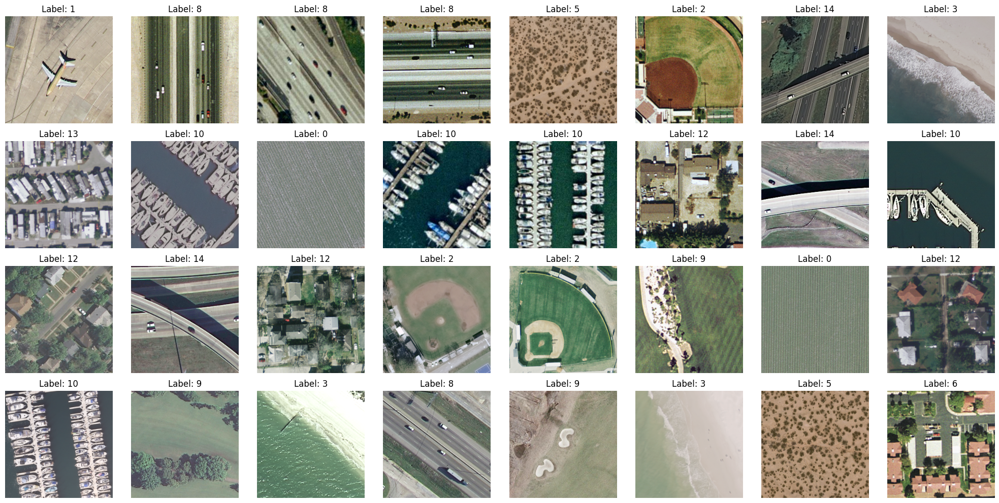

In [14]:
# prompt: I want to display all the 32 images present in a batch

import matplotlib.pyplot as plt

# Assuming train_dataset is your TensorFlow Dataset
for images, labels in train_dataset.take(1):  # Take one batch
    # Display images in a grid
    fig, axes = plt.subplots(4, 8, figsize=(20, 10))  # Adjust grid size as needed
    axes = axes.ravel()  # Flatten the axes array
    for i in range(32):  # Display all 32 images in the batch
        axes[i].imshow(images[i])
        axes[i].set_title(f"Label: {labels[i].numpy()}")
        axes[i].axis('off')

    plt.tight_layout()  # Adjust spacing between subplots
    plt.show()


In [26]:
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=50,
    verbose=1  # Change to 2 if you don't want the progress bar
)


Epoch 1/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - accuracy: 0.1523 - loss: 3.5715 - val_accuracy: 0.0530 - val_loss: 3.1667
Epoch 2/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.3123 - loss: 2.2870 - val_accuracy: 0.0684 - val_loss: 3.5794
Epoch 3/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - accuracy: 0.4239 - loss: 1.8657 - val_accuracy: 0.0640 - val_loss: 4.0631
Epoch 4/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - accuracy: 0.4421 - loss: 1.7909 - val_accuracy: 0.0684 - val_loss: 4.4829
Epoch 5/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.4882 - loss: 1.6323 - val_accuracy: 0.0751 - val_loss: 4.5884
Epoch 6/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - accuracy: 0.5541 - loss: 1.4413 - val_accuracy: 0.1214 - val_loss: 4.2601
Epoch 7/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - accuracy: 0.5639 - loss: 1.3618 - val_accuracy: 0.1523 - val_loss: 3.9428
Epoch 8/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - accuracy: 0.6072 - loss: 1.2447 - val_accuracy

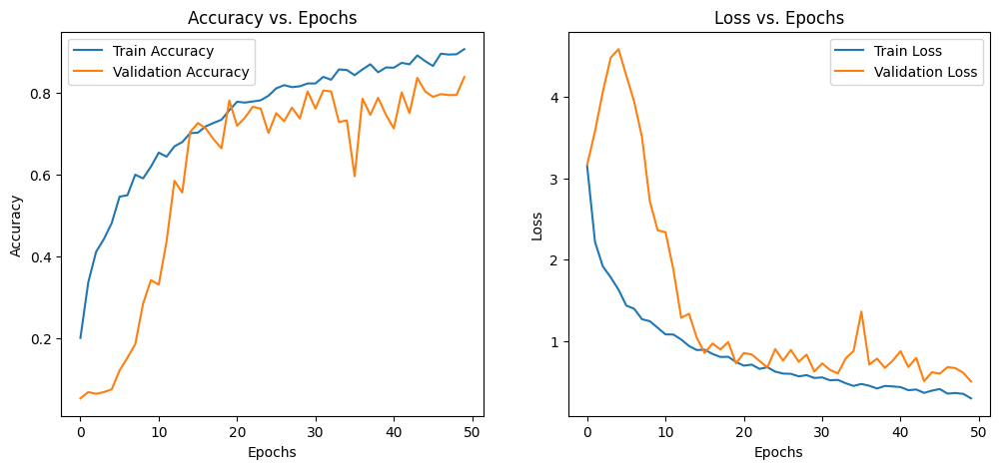

In [27]:
import matplotlib.pyplot as plt

# Extract loss and accuracy values
history_dict = history.history

# Plot accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_dict["accuracy"], label="Train Accuracy")
plt.plot(history_dict["val_accuracy"], label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy vs. Epochs")
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history_dict["loss"], label="Train Loss")
plt.plot(history_dict["val_loss"], label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss vs. Epochs")
plt.legend()

plt.show()


In [30]:
# prompt: create folder named models inside content

# Create the 'models' directory inside the 'content' directory
import os

models_dir = "/content/models"
if not os.path.exists(models_dir):
    os.makedirs(models_dir)
    print(f"Directory '{models_dir}' created successfully.")
else:
    print(f"Directory '{models_dir}' already exists.")


Directory '/content/models' already exists.


In [31]:
model.save("/content/models/cnn_90.keras")


In [29]:
# prompt: now run the test set with this model and give the accuracy

# Evaluate the model on the test dataset
loss, accuracy = model.evaluate(test_dataset)

# Print the accuracy
print(f"Test Accuracy: {accuracy}")


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - accuracy: 0.7711 - loss: 0.7853
Test Accuracy: 0.7788018584251404


In [32]:
import json

with open("/content/models/training_history_cnn_90.json", "w") as f:
    json.dump(history.history, f)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━

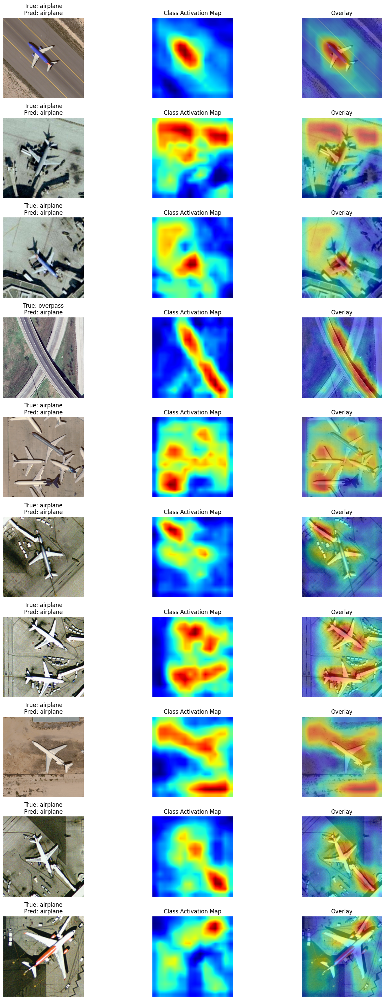

In [38]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

# Define CAM model
conv_layer_name = 'conv2d_14'  # Last convolutional layer
cam_model = tf.keras.Model(inputs=model.input,
                          outputs=[model.output, model.get_layer(conv_layer_name).output])

# Get class names
class_names = sorted(os.listdir("/content/UCMerced_LandUse_Split/test"))

# Get dense layer weights
dense_weights = model.layers[-1].get_weights()[0]  # Shape (512, num_classes)

def generate_cam(image, true_label):
    # Expand to batch dimension
    img_array = tf.expand_dims(image, axis=0)

    # Get predictions and conv outputs
    predictions, conv_outputs = cam_model.predict(img_array)
    pred_class = np.argmax(predictions[0])

    # Get weights for predicted class
    class_weights = dense_weights[:, pred_class]

    # Compute CAM
    cam = tf.reduce_sum(conv_outputs * class_weights, axis=-1)[0]
    cam = tf.nn.relu(cam).numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-7)  # Normalize

    # Resize to original image size
    cam = tf.image.resize(cam[..., np.newaxis], (256, 256)).numpy().squeeze()

    return cam, pred_class

# Filter images where the predicted class is "airplane"
airplane_index = class_names.index("airplane")  # Find index of "airplane"
selected_images = []
selected_labels = []

# Iterate over test dataset
for images, labels in test_dataset.take(10):  # Adjust number as needed
    for i in range(len(images)):
        image = images[i]
        true_label = labels.numpy()[i]

        # Generate CAM and check prediction
        cam, pred_label = generate_cam(image, true_label)
        if pred_label == airplane_index:
            selected_images.append((image, true_label, cam, pred_label))

# Display filtered images
if selected_images:
    plt.figure(figsize=(15, len(selected_images) * 3))
    for i, (image, true_label, cam, pred_label) in enumerate(selected_images):
        img_display = (image.numpy() * 255).astype(np.uint8)

        # Plot original image
        plt.subplot(len(selected_images), 3, i * 3 + 1)
        plt.imshow(img_display)
        plt.title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}")
        plt.axis('off')

        # Plot heatmap
        plt.subplot(len(selected_images), 3, i * 3 + 2)
        plt.imshow(cam, cmap='jet')
        plt.title("Class Activation Map")
        plt.axis('off')

        # Plot overlay
        plt.subplot(len(selected_images), 3, i * 3 + 3)
        plt.imshow(img_display)
        plt.imshow(cam, cmap='jet', alpha=0.5)
        plt.title("Overlay")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No images classified as 'airplane' found.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━

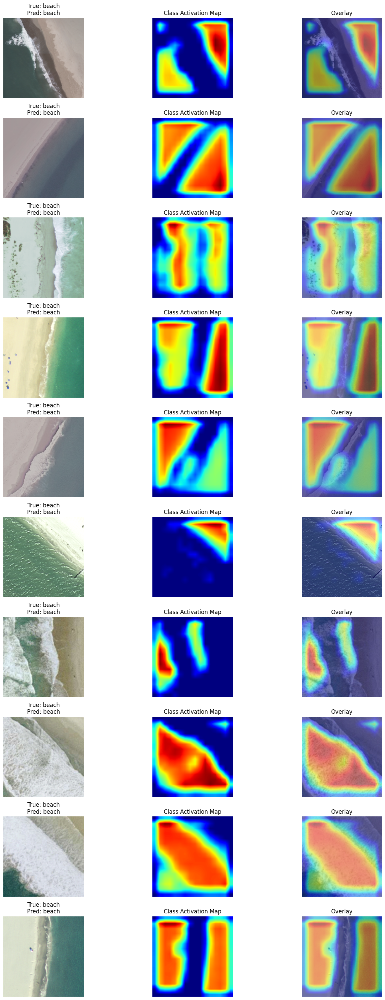

In [39]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

# Define CAM model
conv_layer_name = 'conv2d_14'  # Last convolutional layer
cam_model = tf.keras.Model(inputs=model.input,
                          outputs=[model.output, model.get_layer(conv_layer_name).output])

# Get class names
class_names = sorted(os.listdir("/content/UCMerced_LandUse_Split/test"))

# Get dense layer weights
dense_weights = model.layers[-1].get_weights()[0]  # Shape (512, num_classes)

def generate_cam(image, true_label):
    # Expand to batch dimension
    img_array = tf.expand_dims(image, axis=0)

    # Get predictions and conv outputs
    predictions, conv_outputs = cam_model.predict(img_array)
    pred_class = np.argmax(predictions[0])

    # Get weights for predicted class
    class_weights = dense_weights[:, pred_class]

    # Compute CAM
    cam = tf.reduce_sum(conv_outputs * class_weights, axis=-1)[0]
    cam = tf.nn.relu(cam).numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-7)  # Normalize

    # Resize to original image size
    cam = tf.image.resize(cam[..., np.newaxis], (256, 256)).numpy().squeeze()

    return cam, pred_class

# Filter images where the predicted class is "airplane"
airplane_index = class_names.index("beach")  # Find index of "airplane"
selected_images = []
selected_labels = []

# Iterate over test dataset
for images, labels in test_dataset.take(10):  # Adjust number as needed
    for i in range(len(images)):
        image = images[i]
        true_label = labels.numpy()[i]

        # Generate CAM and check prediction
        cam, pred_label = generate_cam(image, true_label)
        if pred_label == airplane_index:
            selected_images.append((image, true_label, cam, pred_label))

# Display filtered images
if selected_images:
    plt.figure(figsize=(15, len(selected_images) * 3))
    for i, (image, true_label, cam, pred_label) in enumerate(selected_images):
        img_display = (image.numpy() * 255).astype(np.uint8)

        # Plot original image
        plt.subplot(len(selected_images), 3, i * 3 + 1)
        plt.imshow(img_display)
        plt.title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}")
        plt.axis('off')

        # Plot heatmap
        plt.subplot(len(selected_images), 3, i * 3 + 2)
        plt.imshow(cam, cmap='jet')
        plt.title("Class Activation Map")
        plt.axis('off')

        # Plot overlay
        plt.subplot(len(selected_images), 3, i * 3 + 3)
        plt.imshow(img_display)
        plt.imshow(cam, cmap='jet', alpha=0.5)
        plt.title("Overlay")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No images classified as 'airplane' found.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━

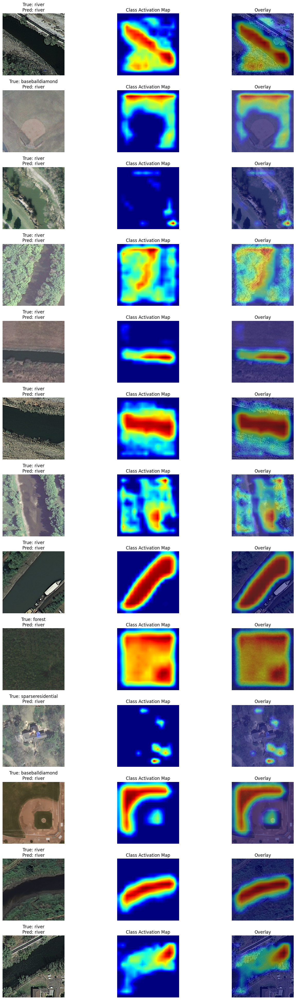

In [40]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

# Define CAM model
conv_layer_name = 'conv2d_14'  # Last convolutional layer
cam_model = tf.keras.Model(inputs=model.input,
                          outputs=[model.output, model.get_layer(conv_layer_name).output])

# Get class names
class_names = sorted(os.listdir("/content/UCMerced_LandUse_Split/test"))

# Get dense layer weights
dense_weights = model.layers[-1].get_weights()[0]  # Shape (512, num_classes)

def generate_cam(image, true_label):
    # Expand to batch dimension
    img_array = tf.expand_dims(image, axis=0)

    # Get predictions and conv outputs
    predictions, conv_outputs = cam_model.predict(img_array)
    pred_class = np.argmax(predictions[0])

    # Get weights for predicted class
    class_weights = dense_weights[:, pred_class]

    # Compute CAM
    cam = tf.reduce_sum(conv_outputs * class_weights, axis=-1)[0]
    cam = tf.nn.relu(cam).numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-7)  # Normalize

    # Resize to original image size
    cam = tf.image.resize(cam[..., np.newaxis], (256, 256)).numpy().squeeze()

    return cam, pred_class

# Filter images where the predicted class is "airplane"
airplane_index = class_names.index("river")  # Find index of "airplane"
selected_images = []
selected_labels = []

# Iterate over test dataset
for images, labels in test_dataset.take(10):  # Adjust number as needed
    for i in range(len(images)):
        image = images[i]
        true_label = labels.numpy()[i]

        # Generate CAM and check prediction
        cam, pred_label = generate_cam(image, true_label)
        if pred_label == airplane_index:
            selected_images.append((image, true_label, cam, pred_label))

# Display filtered images
if selected_images:
    plt.figure(figsize=(15, len(selected_images) * 3))
    for i, (image, true_label, cam, pred_label) in enumerate(selected_images):
        img_display = (image.numpy() * 255).astype(np.uint8)

        # Plot original image
        plt.subplot(len(selected_images), 3, i * 3 + 1)
        plt.imshow(img_display)
        plt.title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}")
        plt.axis('off')

        # Plot heatmap
        plt.subplot(len(selected_images), 3, i * 3 + 2)
        plt.imshow(cam, cmap='jet')
        plt.title("Class Activation Map")
        plt.axis('off')

        # Plot overlay
        plt.subplot(len(selected_images), 3, i * 3 + 3)
        plt.imshow(img_display)
        plt.imshow(cam, cmap='jet', alpha=0.5)
        plt.title("Overlay")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No images classified as 'airplane' found.")
